<a href="https://colab.research.google.com/github/anujabar/Data_analysis/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow Version:",tf.__version__)
print("TensorFlow Hub Version:",hub.__version__)

TensorFlow Version: 2.15.0
TensorFlow Hub Version: 0.16.1


### Checking For GPU

In [2]:
print("Available" if tf.config.list_physical_devices("GPU") else "Not Available")

Available


## Getting Data Ready (Converting images into Tensors i.e. numerical form)

All ml models require data in the numerical form

In [3]:
import pandas as pd
labels_csv=pd.read_csv("drive/MyDrive/dog-vision/labels.csv")
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [4]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: >

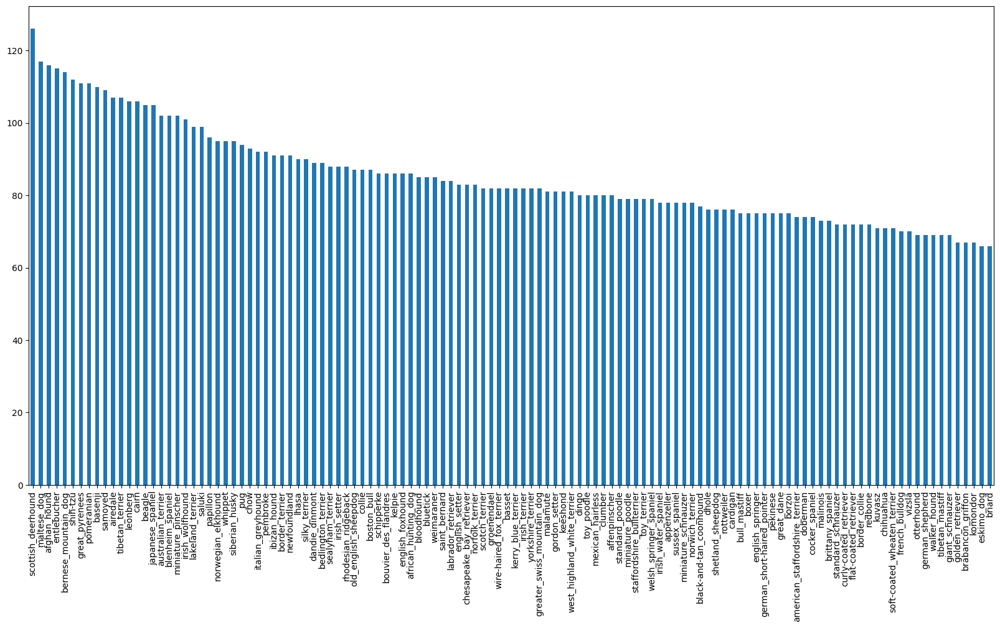

In [5]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [6]:
labels_csv.breed.value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

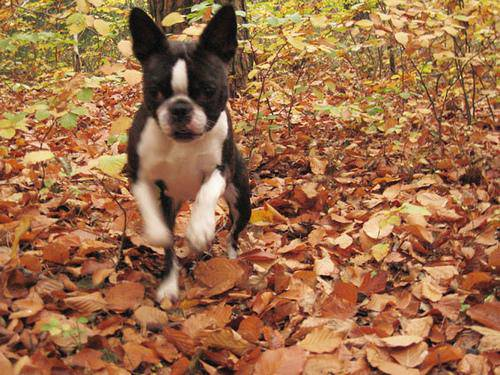

In [7]:
from IPython.display import Image
Image("drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")


## Creating a list of all the image file paths

In [8]:
filenames=["drive/MyDrive/dog-vision/train/"+fname+".jpg" for fname in labels_csv.id]
filenames[:5]

['drive/MyDrive/dog-vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/dog-vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/dog-vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/dog-vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/dog-vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

# Checking whether all images are present in our train folder

In [9]:
import os
if len(os.listdir("drive/MyDrive/dog-vision/train")) == len(filenames):
  print("Yayy")
else:
  print("NOoOOo")

NOoOOo


In [10]:
len(os.listdir("drive/MyDrive/dog-vision/train/"))

10242

In [11]:
len(filenames)

10222

In [12]:
len(labels_csv)

10222

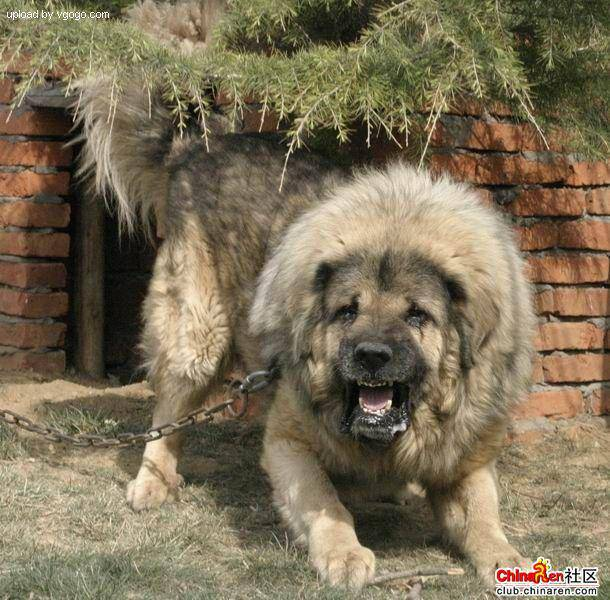

In [13]:
Image(filenames[9000])

In [14]:
labels_csv["breed"][9000]

'tibetan_mastiff'

# Getting Labels Ready

In [15]:
import numpy as np
labels=labels_csv.breed.to_numpy()
# labels=labels_csv.breed
# labels=np.array(labels) same as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

# Making sure number of labels equals number of filepaths

In [16]:
if len(filenames)==len(labels):
  print("Yay")
else:
  print("BOooO")

Yay


In [17]:
unique_breeds=np.unique(labels)
unique_breeds
print(len(unique_breeds))

120


# Making a boolean array of labels

In [18]:
bool_list=[label==unique_breeds for label in labels]
bool_list[:2]


[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
print(len(bool_list))

10222


In [20]:
print(labels[0]) #1st label
print(np.where(unique_breeds==labels[0])) #index of labels[0] in unique_breeds
print(bool_list[0].argmax()) #index of labels[0] in bool_list[0]
print(bool_list[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


# Creating Validation Split

In [21]:
X=filenames #features/data
y=bool_list #labels/target
len(X),len(y)

(10222, 10222)

In [22]:
NUM_IMG=1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [23]:
from sklearn.model_selection import train_test_split

X_train,X_valid,y_train,y_valid=train_test_split(X[:NUM_IMG],y[:NUM_IMG],test_size=0.2,random_state=42)

len(X_train),len(X_valid),len(y_train),len(y_valid)

(800, 200, 800, 200)

# Preprocessing images (Converting to Tensors)

In [24]:
from matplotlib.pyplot import imread #image read
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [25]:
np.max(image),np.min(image) #Rgb values

(255, 0)

In [26]:
image[:2] #outermost value represents innermost

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [27]:
tf.constant(image) #convert to tensor

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

# Creating a function to preprocess our images

In [28]:
IMG_SIZE=224
def process_images(image_path,img_size=IMG_SIZE):
  # Read in the image file
  image=tf.io.read_file(image_path) # returns a tensor of type string
  # Convert the jpeg image into a tensor with 3 colour channels (RGB)
  image=tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1
  image=tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image
  image=tf.image.resize(image,size=[img_size,img_size])

  return image

# Converting data into batches
Default batch size is 32. Data is converted into batches, as if we try to process all images together, memory may run out.

Data must be  a Tensor tuple eg:(image,label)

In [29]:
def get_image_label(image_path,label):
  image=process_images(image_path)
  return image,label

In [30]:
(process_images(X[42]),tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

# Now that we can get our data in the form of Tensor Tuples, let's write function for creating data batches

In [31]:
BATCH_SIZE=32
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  X=image y=label
  If the data is training data, it is shuffled, but if it is validation data, it is not shuffled
  If the data is test data, there will be no labels(y)
  """
  if test_data:
    print("Creating Batches for test data")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process_images).batch(batch_size)
    return data_batch
  elif valid_data:
    print("Creating Batches for validation data")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("Creating Batches for training data")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data=data.shuffle(buffer_size=len(X))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch


In [32]:
train_data=create_data_batches(X_train,y_train)
val_data=create_data_batches(X_valid,y_valid,valid_data=True)

Creating Batches for training data
Creating Batches for validation data


# Visualizing the Batches

In [33]:
import matplotlib.pyplot as plt
def show_images(images,labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1) #rows cols index

    plt.imshow(images[i])

    plt.title(unique_breeds[labels[i].argmax()])

    plt.axis("off")



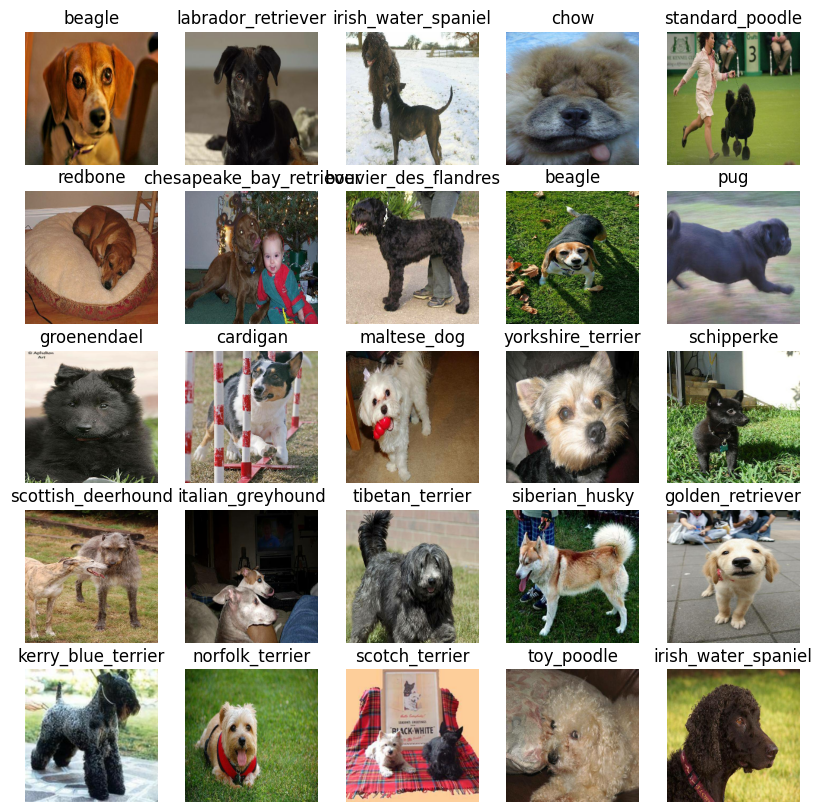

In [34]:
train_images,train_labels=next(train_data.as_numpy_iterator())
show_images(train_images,train_labels)

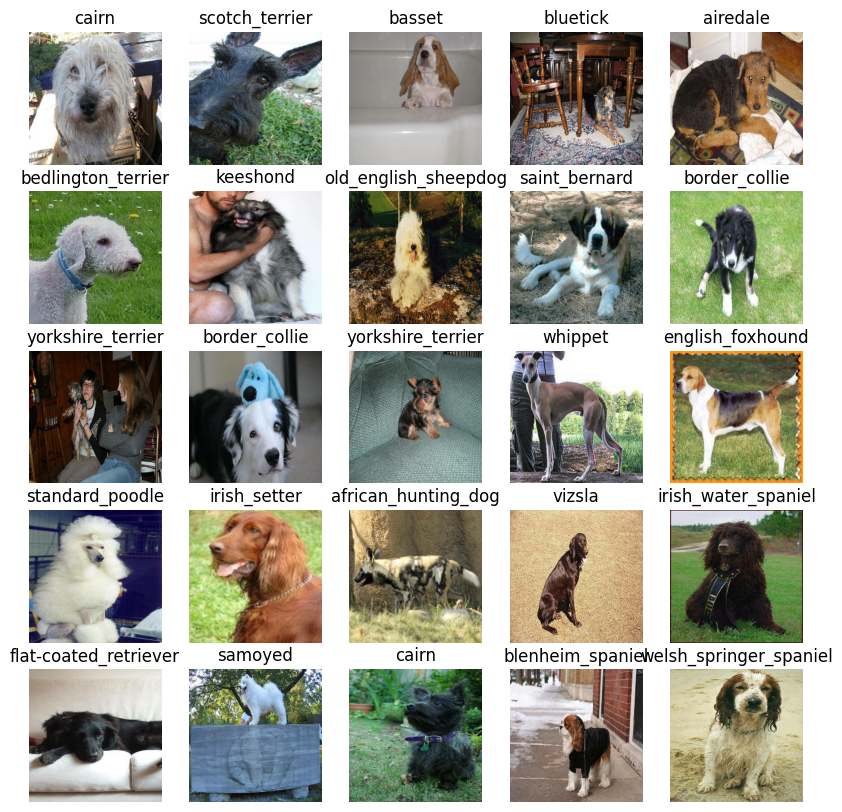

In [35]:
valid_images,valid_labels=next(val_data.as_numpy_iterator())
show_images(valid_images,valid_labels)

# Building the Model
We must define:
1. Input shape (shape of images)
2. Output shape (shape of labels)
3. Model URL

In [36]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3] # batch height width colour channels

OUTPUT_SHAPE=len(unique_breeds)

MODEL_URL="https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

## Now that we have defined our input shape, output shape, and model url. Let's put it together in a Keras deeplearning model
Let's define a function which:
* Takes the input, output shape and model url as parameters
* Defines the layers of the Keras model in sequential fashion (one after the other)
* Compiles the model
* Builds the model
* Returns the model

In [37]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):

  # Define Layers
  model=tf.keras.Sequential([
      hub.KerasLayer(model_url), #Layer 1 (input layer)
      tf.keras.layers.Dense(units=output_shape,activation="softmax") # Layer 2 (output layer)
  ])

  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Minimise loss
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(input_shape)

  return model

In [38]:
model=create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# Creating Callbacks
Callbacks are helper functions that a model can use to save its progress, check its progress, or to stop training early if the model does not improve.

We'll create 2 callbacks, one for TensorBoard which tracks the progress, and one to stop training early if there is no improvement on the validation set(to prevent overfitting)

# TensorBoard callback
* Load the TensorBoard notebook extension
* Create TensorBoard callback which saves logs to a directory and passes them to our models fit() function
* Visualize the training logs with %tensorboard magic function

In [39]:
import datetime
%load_ext tensorboard

def create_tensorboard_callback():
  # create log
  logdir=os.path.join("drive/MyDrive/dog-vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return tf.keras.callbacks.TensorBoard(logdir)


# Early stopping Callback

In [40]:
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

# Training the model (with a subset of our data i.e 1000 samples)

Create a function

In [41]:
NUM_EPOCHS=100 #@param {type:"slider",min:100,max:1000,step:10}

def train_model():
  model=create_model()

  tensorboard=create_tensorboard_callback()

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,early_stopping]
            )

  return model

In [42]:
model=train_model()

Epoch 1/100
25/25 [==============================] - 209s 8s/step - loss: 4.5176 - accuracy: 0.1063 - val_loss: 3.5647 - val_accuracy: 0.2050
Epoch 2/100
25/25 [==============================] - 5s 214ms/step - loss: 1.6005 - accuracy: 0.6925 - val_loss: 2.2519 - val_accuracy: 0.4600
Epoch 3/100
25/25 [==============================] - 4s 169ms/step - loss: 0.5639 - accuracy: 0.9450 - val_loss: 1.7405 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 4s 169ms/step - loss: 0.2496 - accuracy: 0.9825 - val_loss: 1.5254 - val_accuracy: 0.6100
Epoch 5/100
25/25 [==============================] - 5s 182ms/step - loss: 0.1471 - accuracy: 0.9975 - val_loss: 1.4416 - val_accuracy: 0.6350
Epoch 6/100
25/25 [==============================] - 4s 154ms/step - loss: 0.1003 - accuracy: 1.0000 - val_loss: 1.3881 - val_accuracy: 0.6350
Epoch 7/100
25/25 [==============================] - 4s 169ms/step - loss: 0.0752 - accuracy: 1.0000 - val_loss: 1.3529 - val_accuracy: 0.6550


# Visualizing the TensorBoard logs
The TensorBoard magic function %tensorboard can access the logs directory and visualize its contents

In [43]:
%tensorboard --logdir /content/drive/MyDrive/dog-vision/logs

<IPython.core.display.Javascript object>

In [44]:
# minimise loss, increase accuracy
# x->epochs y->loss or accuracy

# Making and evaluating predictions on the validation data which is not used for training

In [45]:
predictions=model.predict(val_data,verbose=1)
predictions
# it gives prediction probabilities also known as confidence levels between 0-1

7/7 [==============================] - 8s 162ms/step


array([[3.8162887e-04, 3.0009276e-05, 6.8910513e-04, ..., 1.2965029e-03,
        8.7693144e-05, 2.5468108e-03],
       [4.8478767e-03, 1.7804934e-03, 4.2173830e-03, ..., 4.0421733e-03,
        8.2914261e-03, 7.5881071e-05],
       [4.4687280e-05, 9.6177006e-05, 1.6291256e-04, ..., 5.1525421e-04,
        1.8384916e-04, 2.8568727e-04],
       ...,
       [1.6136202e-07, 7.9189085e-06, 3.4827317e-05, ..., 4.6527248e-06,
        1.2697083e-04, 2.8885228e-05],
       [1.9094212e-03, 4.7626329e-04, 1.5641827e-04, ..., 5.0892751e-04,
        1.4471817e-04, 1.5448365e-02],
       [4.4338329e-04, 1.8309953e-05, 5.0614233e-04, ..., 2.7592052e-03,
        2.9305555e-03, 1.3854665e-04]], dtype=float32)

In [46]:
predictions[0]

array([3.81628866e-04, 3.00092761e-05, 6.89105131e-04, 1.52614848e-05,
       4.67591279e-04, 7.87243971e-06, 5.93358697e-03, 2.00621071e-04,
       2.53026461e-04, 7.74018874e-04, 3.73813760e-04, 1.59521704e-04,
       1.02625170e-03, 1.67696471e-05, 6.42968982e-04, 2.84742098e-04,
       3.53509386e-05, 5.04096925e-01, 2.41037505e-05, 3.92208931e-05,
       5.15370455e-04, 6.90393426e-05, 4.81648567e-06, 1.26284210e-03,
       8.15732055e-05, 2.57860520e-04, 9.97190401e-02, 1.11686350e-04,
       9.44334257e-04, 3.21127533e-04, 2.14711908e-04, 1.12049573e-03,
       1.06990361e-03, 3.64642656e-05, 2.62154736e-05, 6.82804808e-02,
       6.80472003e-05, 6.62349863e-04, 7.23597841e-05, 1.00384950e-05,
       6.48839283e-04, 1.28608635e-05, 4.90919483e-05, 7.93418803e-05,
       4.69848419e-05, 1.29963853e-04, 3.41025734e-04, 2.77345185e-04,
       2.78632273e-04, 9.36468568e-05, 2.08426878e-04, 1.34300963e-05,
       6.10223738e-04, 1.14673872e-04, 8.12750222e-05, 1.87833011e-05,
      

In [47]:
predictions.shape
#200 is size of val_data

(200, 120)

In [48]:
len(predictions[0])

120

In [49]:
np.min(predictions[0]),np.max(predictions[0]),np.sum(predictions[0]) # sum is around 1 (softmax)

(4.8164857e-06, 0.5040969, 1.0000001)

In [50]:
index=0
print(predictions[index])
print(f"Max value (prediction probability) {np.max(predictions[index])}")
print(f"Max index {np.argmax(predictions[index])}")
print(f"Predicted Label {unique_breeds[np.argmax(predictions[index])]}")

[3.81628866e-04 3.00092761e-05 6.89105131e-04 1.52614848e-05
 4.67591279e-04 7.87243971e-06 5.93358697e-03 2.00621071e-04
 2.53026461e-04 7.74018874e-04 3.73813760e-04 1.59521704e-04
 1.02625170e-03 1.67696471e-05 6.42968982e-04 2.84742098e-04
 3.53509386e-05 5.04096925e-01 2.41037505e-05 3.92208931e-05
 5.15370455e-04 6.90393426e-05 4.81648567e-06 1.26284210e-03
 8.15732055e-05 2.57860520e-04 9.97190401e-02 1.11686350e-04
 9.44334257e-04 3.21127533e-04 2.14711908e-04 1.12049573e-03
 1.06990361e-03 3.64642656e-05 2.62154736e-05 6.82804808e-02
 6.80472003e-05 6.62349863e-04 7.23597841e-05 1.00384950e-05
 6.48839283e-04 1.28608635e-05 4.90919483e-05 7.93418803e-05
 4.69848419e-05 1.29963853e-04 3.41025734e-04 2.77345185e-04
 2.78632273e-04 9.36468568e-05 2.08426878e-04 1.34300963e-05
 6.10223738e-04 1.14673872e-04 8.12750222e-05 1.87833011e-05
 6.51514201e-05 3.12576815e-03 1.18257722e-03 1.16573147e-01
 2.64043483e-04 2.59744811e-05 1.77375088e-03 1.18241551e-05
 3.18443635e-04 1.436220

In [51]:
def get_pred_labels(prediction_probabilities):
  """
  Returns the predicted label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [52]:
get_pred_labels(predictions[0])

'border_terrier'

Because our validation data is still in a batch, we have to unbatch it in
order to compare the predictions on the validation images to the validation labels(true labels)


In [53]:
def unbatchify(data):
  images=[]
  labels=[]

  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images,labels

In [54]:
valid_images,valid_labels=unbatchify(val_data)

In [55]:
valid_images[0],valid_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

# Now Let's visualize

Create a function which takes:
* An array of images, an array of labels, an array of prediction probabilities and an integer
* And plots the max prediction probability, the true image, the true label and the predicted label

In [56]:
def show_preds(prediction_prob,images,labels,n=1):
  pred_prob,img,truth_label=prediction_prob[n],images[n],labels[n]

  pred_label=get_pred_labels(pred_prob)

  plt.imshow(img)
  plt.xticks([])
  plt.yticks([])

  if truth_label==pred_label:
    color="green"
  else:
    color="red"

  plt.title("{} {:.2f}% {}".format(pred_label,np.max(pred_prob)*100,truth_label),color=color)

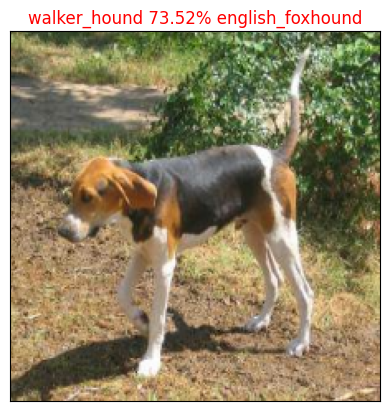

In [57]:
show_preds(predictions,valid_images,valid_labels,42)

## Now that we can visualize our top prediction, let's create a function to visualise the top 10 predictions
The function will:
* Take an array of labels, an array of prediction probabilities and an integer
* And give the prediction probability values of the top 10 predictions, along with prediction probability indexes and prediction labels

In [58]:
def show_top_10_preds(prediction_prob,labels,n):
  pred_prob,truth_label=prediction_prob[n],labels[n]

  top_10_index=pred_prob.argsort()[-10:][::-1]

  top_10_values=pred_prob[top_10_index]

  top_10_labels=unique_breeds[top_10_index]

  plot_data=plt.bar(np.arange(len(top_10_values)),top_10_values,color="gray")

  plt.xticks(np.arange(len(top_10_index)),labels=top_10_labels,rotation="vertical")

  if(np.isin(truth_label,top_10_labels)):
    plot_data[np.argmax(truth_label==top_10_labels)].set_color("green")


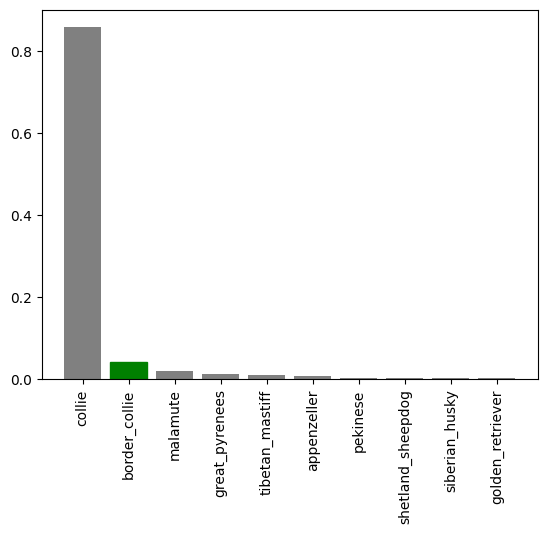

In [59]:
show_top_10_preds(predictions,valid_labels,9)

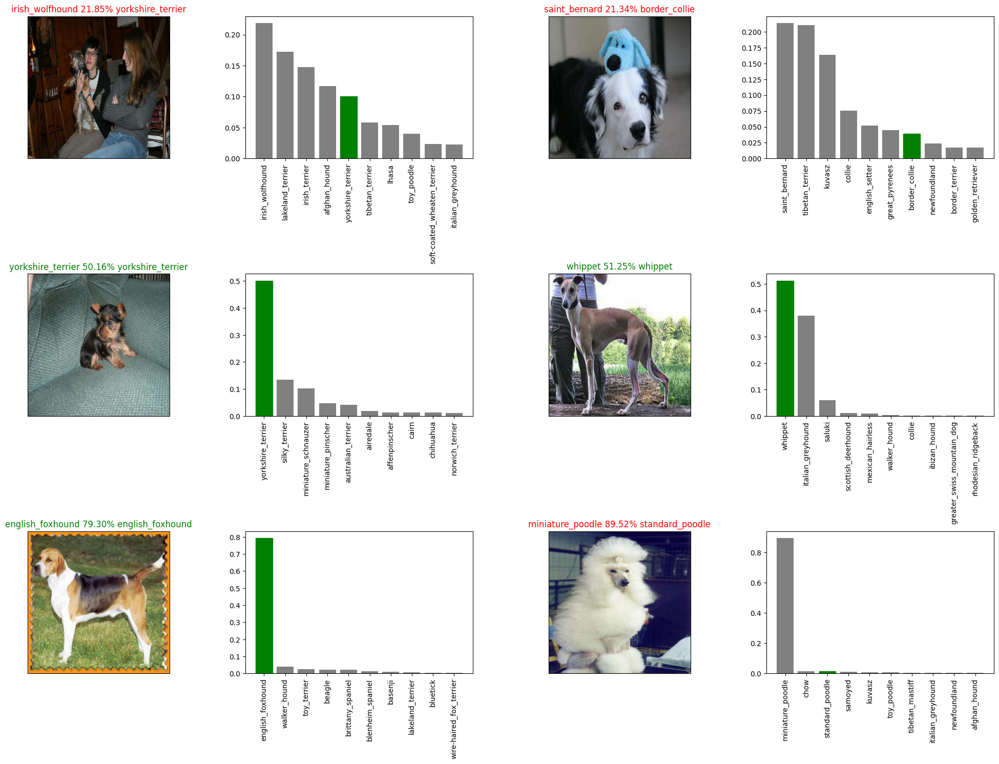

In [60]:
i_multiplier=10
n_rows=3
n_cols=2
num_images=n_rows*n_cols
plt.figure(figsize=(10*n_cols,5*n_rows))
for i in range(num_images):
  plt.subplot(n_rows,n_cols*2,2*i+1)
  show_preds(predictions,valid_images,valid_labels,i+i_multiplier)
  plt.subplot(n_rows,n_cols*2,2*i+2)
  show_top_10_preds(predictions,valid_labels,i+i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()


# Saving  and Loading Our Trained Model

In [61]:
def save_model(model,suffix=None):
  model_dir=os.path.join("drive/MyDrive/dog-vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  model_path=model_dir+"-"+suffix+".h5"

  model.save(model_path)

  return model_path

In [62]:
def load_model(model_path):

  model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})

  return model

In [63]:
save_model(model,"-1000_images")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/dog-vision/models/20240310-145934--1000_images.h5'

In [64]:
loaded_1000=load_model("drive/MyDrive/dog-vision/models/20240111-143839--1000_images.h5")

In [65]:
loaded_1000.evaluate(val_data)

7/7 [==============================] - 1s 112ms/step - loss: 1.1915 - accuracy: 0.6400


[1.1915404796600342, 0.6399999856948853]

In [66]:
model.evaluate(val_data)

7/7 [==============================] - 1s 100ms/step - loss: 1.2602 - accuracy: 0.6650


[1.2602205276489258, 0.6650000214576721]

# Training a model on the full data

In [67]:
# full_data=create_data_batches(X,y)

# full_model_tensorboard_callback=create_tensorboard_callback()
# full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)
# full_model=create_model()

# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks=[full_model_tensorboard_callback,full_model_early_stopping])

# save_model(full_model,"-full_model")


In [68]:
# Making predictions on the test data
full_loaded_model=load_model("drive/MyDrive/dog-vision/models/20240111-154638--full_model.h5")

test_path="drive/MyDrive/dog-vision/test/"

test_filenames=[test_path+fname for fname in os.listdir(test_path)]

test_data=create_data_batches(test_filenames,test_data=True)

# test_preds=full_loaded_model.predict(test_data,verbose=1)

# np.savetxt("drive/MyDrive/dog-vision/preds_array.csv",test_preds)

Creating Batches for test data


In [69]:
import numpy as np
import pandas as pd
test_predictions=np.loadtxt("drive/MyDrive/dog-vision/preds_array.csv")

pred_df=pd.DataFrame(columns=["id"]+list(unique_breeds))

test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]

pred_df["id"]=test_ids

pred_df[list(unique_breeds)]=test_predictions

pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7afb35b8252782013a6700e28e327fa,3.379784e-12,1.148985e-10,5.944553e-11,2.339959e-10,6.718559e-11,1.048973e-08,4.912476e-12,1.136947e-11,2.435656e-10,...,2.609830e-10,2.371372e-08,6.358374e-10,8.766197e-11,3.751649e-08,7.312960e-10,9.897271e-09,2.025174e-10,3.203536e-05,2.177870e-12
1,e7e9624f2a2e61ab187358f5968bfde8,2.318139e-09,3.424954e-10,1.216050e-09,9.731319e-11,2.990123e-08,3.209774e-09,4.349858e-11,1.497760e-09,2.230729e-08,...,2.197754e-08,3.955916e-08,1.915558e-07,6.050889e-09,6.750338e-11,8.952042e-08,8.446162e-10,6.120192e-10,1.469716e-09,7.733681e-10
2,e7fcdf9671a6593b638cbee42842f981,4.735155e-17,1.023863e-14,1.428804e-16,6.496487e-15,3.760452e-15,1.808542e-13,1.017610e-14,2.190418e-14,1.475130e-11,...,3.850447e-17,9.613600e-17,4.914588e-17,1.377930e-13,1.894764e-17,1.000000e+00,2.153762e-14,4.344420e-13,1.082472e-14,3.224859e-18
3,e806a67a05289ac6de6831001664b81b,1.139114e-15,2.451622e-07,6.227276e-12,1.273238e-12,1.772247e-16,9.824789e-14,2.604301e-12,7.442427e-14,3.521274e-07,...,2.807089e-12,4.746360e-13,1.173543e-09,2.911810e-12,3.669454e-12,8.877063e-13,1.218037e-15,2.006644e-09,1.466791e-13,7.363978e-13
4,e850770a6575a34b1c7ad4b401692553,3.238374e-08,1.844168e-05,7.179040e-09,3.263801e-06,2.014605e-09,2.520471e-08,2.497755e-05,1.015094e-09,3.622462e-10,...,7.246679e-07,1.049103e-08,1.338908e-05,1.185060e-07,3.244184e-07,1.423525e-03,1.006632e-09,1.816966e-07,1.612563e-06,1.636143e-04
